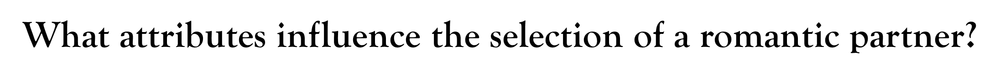

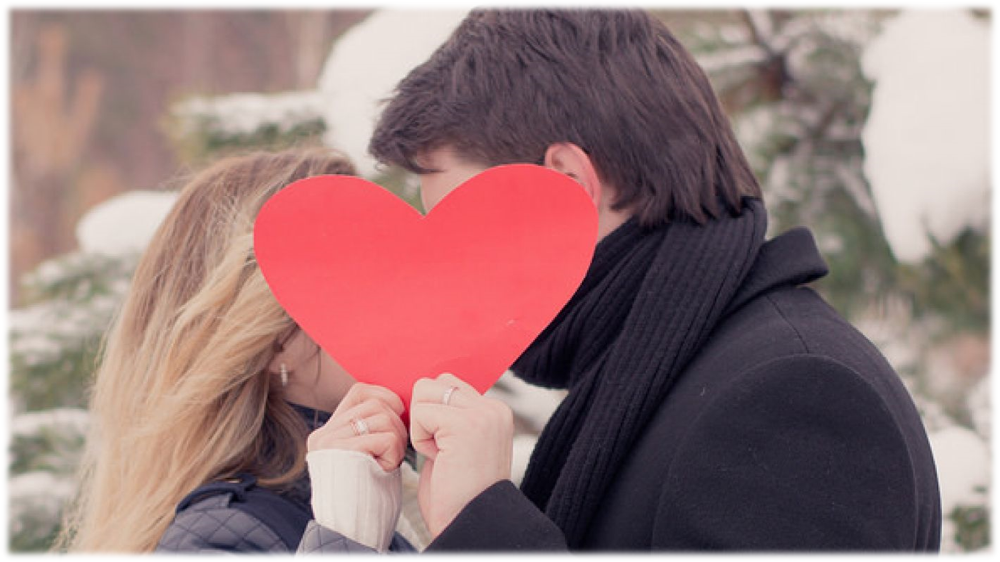

# **About Dataset**

**What influences love at first sight?**<br/> This dataset was compiled by Columbia Business School professors Ray Fisman and Sheena Iyengar for their paper Gender Differences in Mate Selection: Evidence From a Speed Dating Experiment.

Data was gathered from participants in experimental speed-dating events from 2002-2004. During the events, the attendees would have a four-minute "first date" with every other participant of the opposite sex. At the end of their four minutes, participants were asked if they would like to see their date again. They were also asked to rate their date on six attributes: Attractiveness, Sincerity, Intelligence, Fun, Ambition, and Shared Interests.

The dataset also includes questionnaire data gathered from participants at different points in the process. <br/>These fields include demographics, dating habits, self-perception across key attributes, beliefs on what others find valuable in a mate and lifestyle information.

#    <h1><center>*** </center></h1>

# **Steps of the project**


**The project consists of the following sections:<br />**
<ol>
<li>Splitting the data in training and testing sets</li>
<li>Assessing multiple algorithms</li>
<li>Algorithm selected: Gradient Boosting</li>
<li>Hyperparameter tuning</li>
<li>Performance of the model</li>
<li>Drawing conclusions — Summary</li>
<ol>



---



#**Establishing connection between "Colab" to "Google Drive"**

In [ ]:
# Code for connecting our google drive to this collab notebook
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive




---



#**Loading Required Libraries:**

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import math as math



---



# **1. Data Reading**

In [ ]:
# Import dataset into a pandas data frame
df = pd.read_csv('/content/drive/MyDrive/Machine_Learning_ML/new_CSV_file/df.csv', encoding = 'ISO-8859-1')
df.head()

,iid,id,gender,idg,condtn,wave,round,position,positin1,order,...,attr3_3,sinc3_3,intel3_3,fun3_3,amb3_3,attr5_3,sinc5_3,intel5_3,fun5_3,amb5_3
0,1,1,0,1,0,1,10,7,-1,4,...,5.0,7.0,7.0,7.0,7.0,NaN,NaN,NaN,NaN,NaN
1,1,1,0,1,0,1,10,7,-1,3,...,5.0,7.0,7.0,7.0,7.0,NaN,NaN,NaN,NaN,NaN
2,1,1,0,1,0,1,10,7,-1,10,...,5.0,7.0,7.0,7.0,7.0,NaN,NaN,NaN,NaN,NaN
3,1,1,0,1,0,1,10,7,-1,5,...,5.0,7.0,7.0,7.0,7.0,NaN,NaN,NaN,NaN,NaN
4,1,1,0,1,0,1,10,7,-1,7,...,5.0,7.0,7.0,7.0,7.0,NaN,NaN,NaN,NaN,NaN


In [ ]:
# The shape of a DataFrame
df.shape

(8356, 191)



---



**copy data frame**

In [ ]:
df_model = df.copy()

In [ ]:
to_drop = []
tmp = [col for col in df_model.columns if '1_s' in col or '3_s' in col] # asked mid session, not clear when so we drop it
to_drop += tmp
tmp = [col for col in df_model.columns if '_2' in col]  # asked after the session
tmp += ['length']
to_drop += tmp
tmp = [col for col in df_model.columns if '_3' in col]  # asked after the session
tmp += ['you_call', 'them_cal']
to_drop += tmp

print(f"Original shape: {df_model.shape}")
print(f"Dropping {len(to_drop)} columns")

for col in to_drop:
    del df_model[col]

print(f"New shape: {df_model.shape}")

Original shape: (8356, 191)
Dropping 87 columns
New shape: (8356, 104)


In [ ]:
# The shape of a DataFrame
df_model.head(5)

,iid,id,gender,idg,condtn,wave,round,position,positin1,order,...,attr,sinc,intel,fun,amb,shar,like,prob,met,match_es
0,1,1,0,1,0,1,10,7,-1,4,...,6.0,9.0,7.0,7.0,6.0,5.0,7.0,6.0,0,4.0
1,1,1,0,1,0,1,10,7,-1,3,...,7.0,8.0,7.0,8.0,5.0,6.0,7.0,5.0,1,4.0
2,1,1,0,1,0,1,10,7,-1,10,...,5.0,8.0,9.0,8.0,5.0,7.0,7.0,5.0,1,4.0
3,1,1,0,1,0,1,10,7,-1,5,...,7.0,6.0,8.0,7.0,6.0,8.0,7.0,6.0,0,4.0
4,1,1,0,1,0,1,10,7,-1,7,...,5.0,6.0,7.0,7.0,6.0,6.0,6.0,6.0,0,4.0


In [ ]:
print(df_model.columns.tolist())

['iid', 'id', 'gender', 'idg', 'condtn', 'wave', 'round', 'position', 'positin1', 'order', 'partner', 'pid', 'match', 'int_corr', 'samerace', 'age_o', 'race_o', 'pf_o_att', 'pf_o_sin', 'pf_o_int', 'pf_o_fun', 'pf_o_amb', 'pf_o_sha', 'dec_o', 'attr_o', 'sinc_o', 'intel_o', 'fun_o', 'amb_o', 'shar_o', 'like_o', 'prob_o', 'met_o', 'age', 'field_cd', 'undergra', 'mn_sat', 'race', 'imprace', 'imprelig', 'from', 'income', 'goal', 'date', 'go_out', 'career_c', 'sports', 'tvsports', 'exercise', 'dining', 'museums', 'art', 'hiking', 'gaming', 'clubbing', 'reading', 'tv', 'theater', 'movies', 'concerts', 'music', 'shopping', 'yoga', 'exphappy', 'expnum', 'attr1_1', 'sinc1_1', 'intel1_1', 'fun1_1', 'amb1_1', 'shar1_1', 'attr4_1', 'sinc4_1', 'intel4_1', 'fun4_1', 'amb4_1', 'shar4_1', 'attr2_1', 'sinc2_1', 'intel2_1', 'fun2_1', 'amb2_1', 'shar2_1', 'attr3_1', 'sinc3_1', 'fun3_1', 'intel3_1', 'amb3_1', 'attr5_1', 'sinc5_1', 'intel5_1', 'fun5_1', 'amb5_1', 'dec', 'attr', 'sinc', 'intel', 'fun', 'amb'



---



**corr plot**

In [ ]:
# Calculate the correlation matrix for all columns
correlation_matrix = df_model.corr()

# Create a new DataFrame with 'dec' as the index and correlations with other columns
correlation_df = pd.DataFrame(correlation_matrix['dec'])

# Sort the correlations in descending order
correlation_df = correlation_df.sort_values(by='dec', ascending=False)

# Display all rows of the correlation DataFrame in Jupyter Notebook
with pd.option_context('display.max_rows', None):
    print(correlation_df)

<ipython-input-9-988845fef24d>:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  correlation_matrix = df_model.corr()


               dec
dec       1.000000
match     0.522606
like      0.509591
attr      0.483711
fun       0.410247
shar      0.381398
prob      0.306422
intel     0.217261
sinc      0.209205
amb       0.179821
match_es  0.167363
prob_o    0.148855
gender    0.111535
exphappy  0.094563
met_o     0.085854
intel_o   0.084872
sinc_o    0.084153
gaming    0.082210
sinc2_1   0.074578
intel2_1  0.072035
amb_o     0.070699
met       0.067921
shar_o    0.061493
race      0.056795
expnum    0.051018
fun_o     0.047675
fun4_1    0.047235
clubbing  0.046708
pf_o_fun  0.042783
yoga      0.042170
shar1_1   0.041277
intel3_1  0.039982
like_o    0.038377
pf_o_att  0.037693
go_out    0.037229
shar4_1   0.036909
reading   0.035149
pf_o_amb  0.034473
amb2_1    0.030588
concerts  0.030327
income    0.027590
sinc1_1   0.026958
samerace  0.022611
art       0.017206
intel4_1  0.017044
shar2_1   0.016772
tvsports  0.015431
theater   0.014846
hiking    0.013248
age       0.012830
int_corr  0.011918
amb3_1    0.

<ipython-input-10-f2291ec78e8d>:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  correlation_mat = df_model.corr()
<ipython-input-10-f2291ec78e8d>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cor_to_target.sort_values(by='dec', inplace=True)


<Axes: >

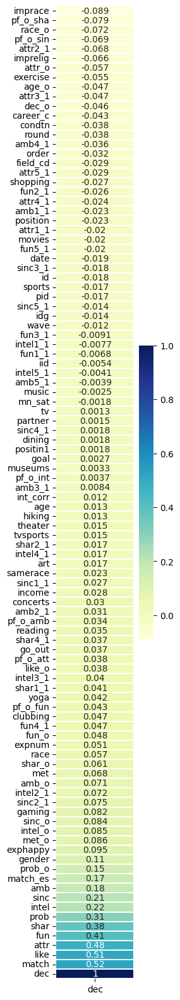

In [ ]:
correlation_mat = df_model.corr()
cor_to_target = correlation_mat[['dec']]
cor_to_target.sort_values(by='dec', inplace=True)
plt.figure(figsize=(2,20))
sns.heatmap(cor_to_target, annot=True,linewidths=.2,cmap="YlGnBu")

In [ ]:
df_model.shape

(8356, 104)

In [ ]:
# Filter features with correlation between -0.01 and 0.01
selected_features = correlation_df[(correlation_df['dec'] >= -0.01) & (correlation_df['dec'] <= 0.01)]

# Extract the feature names from the filtered DataFrame
selected_feature_names = selected_features.index.tolist()

print("Features with correlation between -0.01 and 0.01 with 'dec':")
print(len(selected_feature_names))
print(selected_feature_names)

Features with correlation between -0.01 and 0.01 with 'dec':
17
['amb3_1', 'pf_o_int', 'museums', 'goal', 'positin1', 'dining', 'sinc4_1', 'partner', 'tv', 'mn_sat', 'music', 'amb5_1', 'intel5_1', 'iid', 'fun1_1', 'intel1_1', 'fun3_1']


In [ ]:
# List of column names to delete
columns_to_delete =  ['id','idg','pid']

# Drop the specified columns
df_model = df_model.drop(columns=columns_to_delete)



---



# **4. Modeling**

 ## **4.1.0 What is a person's tendency to say yes?**

## **Pre-processing**

In [ ]:
numeric_cols = [ 'int_corr', 'age_o', 'pf_o_att', 'pf_o_sin', 'pf_o_int', 'pf_o_fun', 'pf_o_amb', 'pf_o_sha', 'attr_o', 'sinc_o', 'intel_o', 'fun_o', 'amb_o', 'shar_o', 'like_o', 'prob_o', 'age', 'imprace', 'imprelig', 'income',  'sports', 'tvsports', 'exercise', 'dining', 'museums', 'art', 'hiking', 'gaming', 'clubbing', 'reading', 'tv', 'theater', 'movies', 'concerts', 'music', 'shopping', 'yoga', 'exphappy', 'expnum', 'attr1_1', 'sinc1_1', 'intel1_1', 'fun1_1', 'amb1_1', 'shar1_1', 'attr4_1', 'sinc4_1', 'intel4_1', 'fun4_1', 'amb4_1', 'shar4_1', 'attr2_1', 'sinc2_1', 'intel2_1', 'fun2_1', 'amb2_1', 'shar2_1', 'attr3_1', 'sinc3_1', 'fun3_1', 'intel3_1', 'amb3_1', 'attr5_1', 'sinc5_1', 'intel5_1', 'fun5_1', 'amb5_1','attr', 'sinc', 'intel', 'fun', 'amb', 'shar', 'like', 'prob', 'match_es']

In [ ]:
all_columns = df_model.columns.tolist()
categorical_cols = [col for col in all_columns if col not in numeric_cols]
len(categorical_cols)

25

In [ ]:
len(numeric_cols)

76

In [ ]:
numeric_cols = [col for col in numeric_cols if col not in selected_feature_names]
print(len(numeric_cols))

64


In [ ]:
columns_to_remove = ['dec']
categorical_cols=[col for col in categorical_cols if col not in columns_to_remove]

In [ ]:
len(categorical_cols)

24

In [ ]:
categorical_cols

['iid',
 'gender',
 'condtn',
 'wave',
 'round',
 'position',
 'positin1',
 'order',
 'partner',
 'match',
 'samerace',
 'race_o',
 'dec_o',
 'met_o',
 'field_cd',
 'undergra',
 'mn_sat',
 'race',
 'from',
 'goal',
 'date',
 'go_out',
 'career_c',
 'met']

In [ ]:
categorical_cols = [col for col in categorical_cols if col not in selected_feature_names]
print(len(categorical_cols))

19


In [ ]:
categorical_cols

['gender',
 'condtn',
 'wave',
 'round',
 'position',
 'order',
 'match',
 'samerace',
 'race_o',
 'dec_o',
 'met_o',
 'field_cd',
 'undergra',
 'race',
 'from',
 'date',
 'go_out',
 'career_c',
 'met']



---



# **Feature engineering** <br/>
Feature engineering is the process of extracting features from the data and transforming them into a format that is suitable for the machine learning model. In this project, we need to transform both numerical and categorical variables. <br/>Most machine learning algorithms require numerical values; therefore, all categorical attributes available in the dataset should be encoded into numerical labels before training the model. <br/>In addition, we need to transform numeric columns into a common scale.<br/> This will prevent that the columns with large values dominate the learning process.

In [ ]:
string_columns = df_model.select_dtypes(include=['string', 'object']).columns.tolist()
string_columns

['undergra', 'from']

In [ ]:
# Replace 'unknown' with -1 only in the specified columns
columns_to_process = ['undergra', 'from']
df_model[columns_to_process] = df_model[columns_to_process].replace('unknown', -1)

In [ ]:
# Count -1 values in the 'undergra' column
undergra_count = (df_model['undergra'] == -1).sum()

# Count -1 values in the 'from' column
from_count = (df_model['from'] == -1).sum()

print("Number of -1 values in 'undergra' column:", undergra_count)
print("Number of -1 values in 'from' column:", from_count)

Number of -1 values in 'undergra' column: 3454
Number of -1 values in 'from' column: 79


In [ ]:
# Create a dictionary to map special values to numeric values
value_mapping = {}

for col in ['undergra', 'from']:
    unique_values = df_model[col].unique()
    unique_values = [val for val in unique_values if val != -1]
    unique_values.sort()  # Sort the unique values
    value_mapping[col] = {val: i + 1 for i, val in enumerate(unique_values)}

# Replace special values with numeric values while leaving -1 as it is
for col in ['undergra', 'from']:
    df_model[col] = df_model[col].replace(value_mapping[col])

In [ ]:
df_model['from'].unique()

array([ 48,   2,  57, 207,  28, 119, 198, 107, 157,   1,   7,  66,  52,
       122, 125,  74, 139,  39, 229, 137,   6,  84,  95, 237,  -1, 233,
        25, 123, 193,  30,  29,  51, 111, 189,  50, 184, 199,  96, 204,
        97, 164,  85,  32,  69, 217,   4, 159,  26, 121, 216, 200, 108,
       131, 153,  91, 231, 160,   8, 130, 144,  75, 156, 182,  16, 109,
        34,  88,  46,  56,   5, 166, 128,  33,  71, 110, 173, 120, 113,
       117, 202, 142, 118,  90, 172, 194,  79, 206,  68,  54,   3,  47,
       129, 149, 155, 165,  11,  53, 150,  77, 145, 201,  63, 230,  20,
        36, 162, 181, 224, 133, 174, 100,  10, 222,  14, 112, 141, 175,
       205,  19, 146, 192, 225, 208,  45,  37, 140,  15, 177,  62, 228,
       203, 167,  65,  98, 226,  92, 238,  24, 171, 188, 105, 190,  49,
       215,  99,  27, 148,  86, 114, 102, 227, 232, 213,  60, 191, 136,
       104,  35, 178, 220,  87,  94, 134, 147, 152,  44, 135, 234,  72,
       211,  67, 236, 223,  76,  40, 170, 143,  61,  22, 158, 13

In [ ]:
df_model['undergra'].unique()

array([ -1,  61,  76, 207, 169, 147,  35, 143,   6, 132, 233, 217,  33,
       145,  59,  43, 180,   2,  74, 184, 155, 200, 222,  70, 148, 121,
       137,  18, 216, 232,  37, 140,  30,  29, 230, 214,  16, 113,  27,
       164, 105, 124, 172, 220,  97, 204, 120,  34, 150, 119,  39,  53,
        73, 206, 159,  95, 126,   3, 174, 226, 144, 101,  93,  90,  77,
       213,  99, 231, 149, 142, 221,  17,  47, 116,  54,  69, 114, 165,
        52,  83,  57,  20,  56, 186,  10,  22, 176, 219,  44, 156,  64,
        55, 151, 123, 203, 173,  11,  78, 168,   5, 185,   9, 136,  87,
       191,  84, 229,  67,  80, 177,  85,  75,  96,  72,  25,  14,  79,
        71, 182, 138, 212, 160, 107, 103, 202, 133,  15, 205,  31,  89,
       110,  62,  21, 218,  12, 199, 196, 146,  51, 215, 175,  65,  50,
       153, 115,  60, 195,   8, 104,  45, 234,  13,  81, 170, 189,  48,
       166,  23, 109, 129, 127, 211, 228, 141, 158, 225, 179,  94, 161,
       183, 192, 106, 100, 197, 131, 209, 125, 122,  92,  28,  5



---



## **Train-Test Split**<br/>
First, we create a variable x to store the independent attributes of the dataset. <br/>Additionally, we create a variable y to store only the target variable (dec).

In [ ]:
# Combine numeric and categorical column lists into all_columns
all_columns = numeric_cols + categorical_cols
df_model = df_model[all_columns + ["dec"]]

# Remove "dec" from all_columns to create column_names_without_dec
column_names_without_dec = [col for col in all_columns if col != "dec"]

# Assuming you have a DataFrame named df_model
# Separate the target column "dec" from the rest of the features
x = df_model[column_names_without_dec]
y = df_model["dec"]

# Print the shapes of x and y
print(f'x shape: {x.shape}, y shape: {y.shape}')

x shape: (8356, 83), y shape: (8356,)


Then, we can use the train_test_split function from the sklearn.model_selection package to create both the training and testing sets.

In [ ]:
from sklearn.model_selection import train_test_split

# Assuming x and y are properly defined
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.20, random_state=0, stratify=x[['gender', 'wave']])

print(f'x train: {len(x_train)}, x test: {len(x_test)}')
print(f'y train: {len(y_train)}, y test: {len(y_test)}')

x train: 6684, x test: 1672
y train: 6684, y test: 1672


## **Features Encoding**

In [ ]:
# Numeric Features
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
scaler.fit(x_train[numeric_cols])
x_train_numeric = scaler.transform(x_train[numeric_cols])
x_test_numeric = scaler.transform(x_test[numeric_cols])

print(f'x train: {x_train_numeric.shape}, x test: {x_test_numeric.shape}\n\n')

x train: (6684, 64), x test: (1672, 64)




In [ ]:
# Categorial Features
from sklearn.preprocessing import OneHotEncoder

enc = OneHotEncoder(handle_unknown='ignore')
enc.fit(x_train[categorical_cols])
x_train_categorial = enc.transform(x_train[categorical_cols])
x_test_categorial = enc.transform(x_test[categorical_cols])

print(f'x train: {x_train_categorial.shape}, x test: {x_test_categorial.shape}\n\n')

x train: (6684, 638), x test: (1672, 638)




##### **Combine the features**

In [ ]:
x_train = np.asarray(np.hstack((x_train_numeric, x_train_categorial.todense())))
x_test = np.asarray(np.hstack((x_test_numeric, x_test_categorial.todense())))

print(f'x train shape: {x_train.shape}, x test shape: {x_test.shape}')

x train shape: (6684, 702), x test shape: (1672, 702)


#    <h1><center>*** </center></h1>

## **Assessing Multiple Algorithms**<br/>
Algorithm selection is a key challenge in any machine learning project since there is not algorithm that is the best across all projects. Generally, we need to evaluate a set of potential candidates and select for further evaluation those that provide better performance.

In this project, we compare 5 different algorithms, all of them already implemented in Scikit-Learn:<br/>

* Random Forest
* K Neighbors Neighbours(KNN)
* Support Vector Machines(SVC)
* Logistic Regression
* Decision Tree

In [ ]:
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier

# Create a list of candidate models
models = [
    ('Random Forest', RandomForestClassifier()),
    ('SVC', SVC()),
    ('Logistic Regression', LogisticRegression(max_iter=1000)),
    ('K-Nearest Neighbors', KNeighborsClassifier()),
    ('Decision Tree Classifier', DecisionTreeClassifier())
]

# Split your data into training and testing sets
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42)  # Adjust test_size as needed

# Add scaling data to your pipeline
scaler = StandardScaler()
x_train_scaled = scaler.fit_transform(x_train)
x_test_scaled = scaler.transform(x_test)

# Initialize variables to track the best model and accuracy
best_model = None
best_accuracy = 0

# Test the accuracy of each model using default hyperparameters
results = []
names = []
scoring = 'accuracy'
for name, model in models:
    # Fit the model with the training data
    model.fit(x_train_scaled, y_train)
    # Make predictions with the testing data
    predictions = model.predict(x_test_scaled)
    # Calculate accuracy
    accuracy = accuracy_score(y_test, predictions)
    # Append the model name and the accuracy to the lists
    results.append(accuracy)
    names.append(name)
    # Print classifier accuracy
    print('Classifier: {}, Accuracy: {:.2f}%'.format(name, accuracy * 100))

    # Check if this model has the best accuracy so far
    if accuracy > best_accuracy:
        best_accuracy = accuracy
        best_model = name

# Print the best model and its accuracy
print("\nBest Model: {}, Accuracy: {:.2f}%".format(best_model, best_accuracy * 100))

Classifier: Random Forest, Accuracy: 89.35%
Classifier: SVC, Accuracy: 88.70%
Classifier: Logistic Regression, Accuracy: 86.66%
Classifier: K-Nearest Neighbors, Accuracy: 74.58%
Classifier: Decision Tree Classifier, Accuracy: 84.93%

Best Model: Random Forest, Accuracy: 89.35%


It is important to bear in mind that we have trained all the algorithms using the default hyperparameters. <br/>The accuracy of many machine learning algorithms is highly sensitive to the hyperparameters chosen for training the model. <br/>A more in-depth analysis will include an evaluation of a wider range of hyperparameters (not only default values) before choosing a model (or models) for hyperparameter tuning. Nonetheless, this is out of the scope of this article. In this example, we will only further evaluate the model that presents higher accuracy using the default hyperparameters. <br/>As shown above, this corresponds to the random forest model which shows an accuracy of nearly 89%.

# **Comparing algorithms and selected an algorithm**

A Random Forest model is a widely adopted machine learning algorithm that excels at solving complex classification and regression tasks. It operates on the principle of ensemble learning, which means it combines the predictions of multiple decision trees to make more accurate and robust predictions.

Random Forests work by growing a multitude of decision trees, each trained on a subset of the data and using a random subset of features. This randomness in data and feature selection helps to reduce overfitting and makes the model more robust. When it comes to making predictions, the Random Forest aggregates the outputs of all individual trees, typically by taking a majority vote for classification tasks or averaging for regression tasks. This ensemble approach enhances the model's ability to generalize and improves its overall performance.

Random Forest models offer several hyperparameters that can be fine-tuned to achieve optimal results:

1. **Number of Trees (n_estimators)**: This hyperparameter controls the number of decision trees in the ensemble. A higher number of trees can lead to better performance but may increase computation time.

2. **Max Depth of Trees (max_depth)**: It determines the maximum depth of each decision tree in the forest. A deeper tree can capture more complex relationships but is also more prone to overfitting.

3. **Minimum Samples per Leaf (min_samples_leaf)**: This parameter sets the minimum number of samples required to be in a leaf node of a tree. It helps prevent the creation of very small and specific leaf nodes.

4. **Maximum Features (max_features)**: This hyperparameter specifies the number of features to consider when looking for the best split at each node. It introduces randomness by considering only a subset of features for each split.

5. **Criterion for Splitting (criterion)**: You can choose between 'gini' or 'entropy' to determine the criterion for splitting nodes in the decision trees. 'Gini' measures impurity, while 'entropy' assesses information gain.

Random Forests are versatile and can handle both classification and regression tasks with ease. They are known for their robustness, resistance to overfitting, and ability to handle high-dimensional data. Additionally, they can provide valuable insights into feature importance, allowing you to understand the most critical factors affecting the model's predictions.

In practice, tuning these hyperparameters and assessing feature importance are crucial steps in optimizing a Random Forest model for your specific machine learning task. This process, known as hyperparameter tuning, ensures that the Random Forest algorithm delivers the best possible results for your data.

# **Hyperparameter tuning**<br/>
Thus far we have split our data into a training set for learning the parameters of the model, and a testing set for evaluating its performance. The next step in the machine learning process is to perform hyperparameter tuning. The selection of hyperparameters consists of testing the performance of the model against different combinations of hyperparameters, selecting those that perform best according to a chosen metric and a validation method.

For hyperparameter tuning, we need to split our training data again into a set for training and a set for testing the hyperparameters (often called validation set). It is a very common practice to use k-fold cross-validation for hyperparameter tuning. The training set is divided again into k equal-sized samples, 1 sample is used for testing and the remaining k-1 samples are used for training the model, repeating the process k times. Then, the k evaluation metrics (in this case the accuracy) are averaged to produce a single estimator.

There are multiple techniques to find the best hyperparameters for a model. The most popular methods are:<br/> (1) grid search<br/>(2) random search<br/> (3) bayesian optimization<br/> Grid search test all combinations of hyperparameters and select the best performing one. It is a really time-consuming method, particularly when the number of hyperparameters and values to try are really high.

In random search, you specify a grid of hyperparameters, and random combinations are selected where each combination of hyperparameters has an equal chance of being sampled. We do not analyze all combinations of hyperparameters, but only random samples of those combinations. This approach is much more computationally efficient than trying all combinations; however, it also has some disadvantages. The main drawback of random search is that not all areas of the grid are evenly covered, especially when the number of combinations selected from the grid is low.

*We can implement random search in Scikit-learn using the RandomSearchCV class from the sklearn.model_selection package.*

First of all, we specify the SVM of hyperparameter values using a dictionary (svm_parameters) where the keys represent the hyperparameters and the values are the set of options we want to evaluate. Then, we define the RandomizedSearchCV object for trying different random combinations from this SVM. The number of hyperparameter combinations that are sampled is defined in the n_iter parameter. Naturally, increasing n_iter will lead in most cases to more accurate results, since more combinations are sampled; however, on many occasions, the improvement in performance won’t be significant.

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import RandomizedSearchCV

random_forest_grid = {
    'n_estimators': [80, 90, 100, 110, 115, 120],
    'max_depth': [3, 4, 5, 6],
    'max_features': [None, 'auto', 'sqrt', 'log2'],
    'min_samples_split': [2, 3, 4, 5]}

total_combinations = len(random_forest_grid['n_estimators']) * len(random_forest_grid['max_depth']) * len(random_forest_grid['max_features']) * len(random_forest_grid['min_samples_split'])

n_iter = min(150, total_combinations)
random_forest_random_search = RandomizedSearchCV(
    estimator=RandomForestClassifier(),
    param_distributions=random_forest_grid,
    cv=5,
    n_iter=n_iter,
    n_jobs=-1)

random_forest_random_search.fit(x_train, y_train)
print("Best Hyperparameters:", random_forest_random_search.best_params_)
best_rf_hyperparameters = random_forest_random_search.best_params_

Best Hyperparameters: {'n_estimators': 100, 'min_samples_split': 3, 'max_features': None, 'max_depth': 6}


After fitting the grid object, we can obtain the best hyperparameters using best_params_attribute. <br/>As you can above, the best hyperparameters are: {‘n_estimators’: 90, ‘min_samples_split’: 3, ‘max_features’: ‘log2’, ‘max_depth’: 3}.

**Cross-Validation**

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split, cross_val_score

best_n_estimators = best_rf_hyperparameters['n_estimators']
best_max_depth = best_rf_hyperparameters['max_depth']
best_max_features = best_rf_hyperparameters['max_features']
best_min_samples_split = best_rf_hyperparameters['min_samples_split']

best_rf = RandomForestClassifier(
    n_estimators=best_n_estimators,
    max_depth=best_max_depth,
    max_features=best_max_features,
    min_samples_split=best_min_samples_split
)

unique_waves = df_model['wave'].unique()
wave_accuracies = {}

for wave_number in unique_waves:
    wave_data = df_model[df_model['wave'] == wave_number]
    x_wave = wave_data.drop('dec', axis=1)
    y_wave = wave_data['dec']
    wave_accuracy = np.mean(cross_val_score(best_rf, x_wave, y_wave, cv=5))
    wave_accuracies[wave_number] = wave_accuracy

for wave_number, accuracy in wave_accuracies.items():
    print(f"Wave {wave_number}: Accuracy = {accuracy:.4f}")
average_accuracy = np.mean(list(wave_accuracies.values()))
print(f"Average Accuracy for All Wave Numbers: {average_accuracy:.4f}")

Wave 1: Accuracy = 0.8500
Wave 2: Accuracy = 0.6891
Wave 3: Accuracy = 0.7700
Wave 4: Accuracy = 0.8303
Wave 5: Accuracy = 0.8278
Wave 6: Accuracy = 0.6800
Wave 7: Accuracy = 0.7729
Wave 8: Accuracy = 0.7850
Wave 9: Accuracy = 0.7550
Wave 10: Accuracy = 0.7530
Wave 11: Accuracy = 0.7439
Wave 12: Accuracy = 0.8316
Wave 13: Accuracy = 0.7611
Wave 14: Accuracy = 0.8278
Wave 15: Accuracy = 0.7894
Wave 16: Accuracy = 0.8116
Wave 17: Accuracy = 0.6857
Wave 18: Accuracy = 0.5167
Wave 19: Accuracy = 0.7956
Wave 20: Accuracy = 0.5588
Wave 21: Accuracy = 0.8534
Average Accuracy for All Wave Numbers: 0.7566


### **Performace of the model**<br/>
The last step of the machine learning process is to check the performance of the model (best hyperparameters ) by using the confusion matrix and some evaluation metrics.

**Confusion Matrix** <br/>

The confusion matrix, also known as the error matrix, is used to evaluate the performance of a machine learning model by examining the number of observations that are correctly and incorrectly classified. Each column of the matrix contains the predicted classes while each row represents the actual classes or vice versa. In a perfect classification, the confusion matrix will be all zeros except for the diagonal.<br/> All the elements out of the main diagonal represent misclassifications. It is important to bear in mind that the confusion matrix allows us to observe patterns of misclassification (which classes and to which extend they were incorrectly classified).

**In binary classification problems, the confusion matrix is a 2-by-2 matrix composed of 4 elements:**<br/>
* TP (True Positive): number of patients with spine problems that are correctly classified as sick.
* TN (True Negative): number of patients without pathologies who are correctly classified as healthy.
* FP (False Positive): number of healthy patients that are wrongly classified as sick.
* FN (False Negative): number of patients with spine diseases that are misclassified as healthy.

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report

# Train the model on your training data
best_rf.fit(x_train, y_train)

# Make predictions on both the training and test data
y_train_pred_rf = best_rf.predict(x_train)
y_test_pred_rf = best_rf.predict(x_test)

# Generate and print classification reports for both sets
class_report_train_rf = classification_report(y_train, y_train_pred_rf)
class_report_test_rf = classification_report(y_test, y_test_pred_rf)

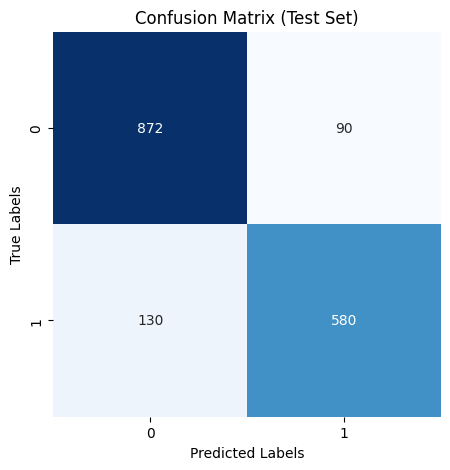

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix
# Generate and plot the Confusion Matrix for the test set
conf_matrix = confusion_matrix(y_test, y_test_pred_rf)

plt.figure(figsize=(5, 5))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix (Test Set)')
plt.show()

*As shown above, 1329 observations of the testing data were correctly classified by the model (826 true negatives and 503 true positives).<br/> On the contrary, we can observe 343 misclassifications (129 false positives and 214 false negatives).*

**Evaluation metrics**

In [ ]:
print("Classification Report for Training Data:\n", class_report_train_rf)

Classification Report for Training Data:
               precision    recall  f1-score   support

           0       0.89      0.93      0.91      3884
           1       0.89      0.84      0.86      2800

    accuracy                           0.89      6684
   macro avg       0.89      0.88      0.89      6684
weighted avg       0.89      0.89      0.89      6684



In [ ]:
print("Classification Report for Test Data:\n", class_report_test_rf)

Classification Report for Test Data:
               precision    recall  f1-score   support

           0       0.87      0.91      0.89       962
           1       0.87      0.82      0.84       710

    accuracy                           0.87      1672
   macro avg       0.87      0.86      0.86      1672
weighted avg       0.87      0.87      0.87      1672



*As shown above, we obtain a **sensitivity** of 0.7 (503/(214+503)) and a **specificity** of 0.86 (826/(8226+129)). <br/>The model obtained predicts more accurately a partner who decided not to continue dating. This should not surprise us at all, since gradient boosting classifiers are usually biased toward the classes with more observations.*

**The accuracy of the classification**

In [ ]:
# Evaluate the model with the best hyperparameters on the test set
best_rf = random_forest_random_search.best_estimator_
test_accuracy = best_rf.score(x_test, y_test)
print("Test Accuracy with Best Hyperparameters:", test_accuracy)

Test Accuracy with Best Hyperparameters: 0.867822966507177


As you may have noticed, the previous summary does not contain the accuracy of the classification. <br/>However, this can be easily calculated using the function accuracy_score from the metrics module.

*As you can observe, hyperparameter tuning has barely increased the accuracy of the model.*

# **Feature Engineering**

In [ ]:
FE_df_model = df_model.copy()
FE_df_model.shape

(8356, 84)

In [ ]:
# waves where the points were given differently
FE_df_model['vote_differently'] = 0
FE_df_model.loc[(df_model.wave > 5) & (df_model.wave < 10), 'vote_differently'] = 1

# wave where they could choose only 50%
FE_df_model['on_a_budget'] = 0
FE_df_model.loc[df_model.wave == 12, 'on_a_budget'] = 1

# waves where they were asked to come with a magazine
FE_df_model['with_magazine'] = 0
FE_df_model.loc[(df_model.wave == 18) | (df_model.wave == 21), 'with_magazine'] = 1

# waves where they were asked to come with a book
FE_df_model['with_book'] = 0
FE_df_model.loc[(df_model.wave == 19) | (df_model.wave == 20), 'with_book'] = 1

In [ ]:
FE_df_model.shape

(8356, 88)

**corr plot**

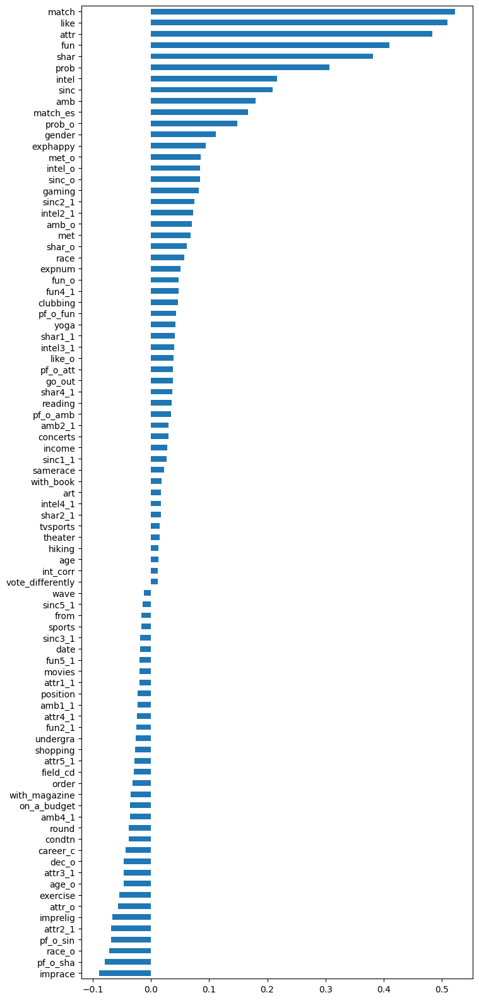

In [ ]:
FE_df_model.corr()['dec'].drop('dec').sort_values(ascending=True).plot(kind='barh',figsize=(8, 20))
plt.show()

## **Pre-processing**

In [ ]:
len(numeric_cols)

64

In [ ]:
all_columns = FE_df_model.columns.tolist()
len(all_columns)

88

In [ ]:
categorical_cols = [col for col in all_columns if col not in numeric_cols]
len(categorical_cols)

24

In [ ]:
columns_to_remove = ['dec']
categorical_cols=[col for col in categorical_cols if col not in columns_to_remove]

In [ ]:
len(categorical_cols)

23

In [ ]:
categorical_cols

['gender',
 'condtn',
 'wave',
 'round',
 'position',
 'order',
 'match',
 'samerace',
 'race_o',
 'dec_o',
 'met_o',
 'field_cd',
 'undergra',
 'race',
 'from',
 'date',
 'go_out',
 'career_c',
 'met',
 'vote_differently',
 'on_a_budget',
 'with_magazine',
 'with_book']

## **Train-Test Split**<br/>
First, we create a variable x to store the independent attributes of the dataset. <br/>Additionally, we create a variable y to store only the target variable (dec).

In [ ]:
# Separate the target column "dec" from the rest of the features
x = FE_df_model.drop('dec', axis=1)  # Features
y = FE_df_model['dec']  # Target variable

# Print the shapes of x and y
print(f'x shape: {x.shape}, y shape: {y.shape}')

x shape: (8356, 87), y shape: (8356,)


In [ ]:
from sklearn.model_selection import train_test_split

# Assuming x and y are properly defined
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.20, random_state=0, stratify=x[['gender', 'wave']])

print(f'x train: {len(x_train)}, x test: {len(x_test)}')
print(f'y train: {len(y_train)}, y test: {len(y_test)}')

x train: 6684, x test: 1672
y train: 6684, y test: 1672


## **Features Encoding**

In [ ]:
# Numeric Features
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
scaler.fit(x_train[numeric_cols])
x_train_numeric = scaler.transform(x_train[numeric_cols])
x_test_numeric = scaler.transform(x_test[numeric_cols])

print(f'x train: {x_train_numeric.shape}, x test: {x_test_numeric.shape}\n\n')

x train: (6684, 64), x test: (1672, 64)




In [ ]:
# Categorial Features
from sklearn.preprocessing import OneHotEncoder

enc = OneHotEncoder(handle_unknown='ignore')
enc.fit(x_train[categorical_cols])
x_train_categorial = enc.transform(x_train[categorical_cols])
x_test_categorial = enc.transform(x_test[categorical_cols])

print(f'x train: {x_train_categorial.shape}, x test: {x_test_categorial.shape}\n\n')

x train: (6684, 646), x test: (1672, 646)




##### **Combine the features**

In [ ]:
x_train = np.asarray(np.hstack((x_train_numeric, x_train_categorial.todense())))
x_test = np.asarray(np.hstack((x_test_numeric, x_test_categorial.todense())))

print(f'x train shape: {x_train.shape}, x test shape: {x_test.shape}')

x train shape: (6684, 710), x test shape: (1672, 710)


#    <h1><center>*** </center></h1>

## **Assessing Multiple Algorithms**<br/>
Algorithm selection is a key challenge in any machine learning project since there is not algorithm that is the best across all projects. Generally, we need to evaluate a set of potential candidates and select for further evaluation those that provide better performance.

In this project, we compare 5 different algorithms, all of them already implemented in Scikit-Learn:<br/>

* Random Forest
* K Neighbors Neighbours(KNN)
* Support Vector Machines(SVC)
* Logistic Regression
* Decision Tree

In [ ]:
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier

# Create a list of candidate models
models = [
    ('Random Forest', RandomForestClassifier()),
    ('SVC', SVC()),
    ('Logistic Regression', LogisticRegression(max_iter=1000)),
    ('K-Nearest Neighbors', KNeighborsClassifier()),
    ('Decision Tree Classifier', DecisionTreeClassifier())
]

# Split your data into training and testing sets
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42)  # Adjust test_size as needed

# Add scaling data to your pipeline
scaler = StandardScaler()
x_train_scaled = scaler.fit_transform(x_train)
x_test_scaled = scaler.transform(x_test)

# Initialize variables to track the best model and accuracy
best_model = None
best_accuracy = 0

# Test the accuracy of each model using default hyperparameters
results = []
names = []
scoring = 'accuracy'
for name, model in models:
    # Fit the model with the training data
    model.fit(x_train_scaled, y_train)
    # Make predictions with the testing data
    predictions = model.predict(x_test_scaled)
    # Calculate accuracy
    accuracy = accuracy_score(y_test, predictions)
    # Append the model name and the accuracy to the lists
    results.append(accuracy)
    names.append(name)
    # Print classifier accuracy
    print('Classifier: {}, Accuracy: {:.2f}%'.format(name, accuracy * 100))

    # Check if this model has the best accuracy so far
    if accuracy > best_accuracy:
        best_accuracy = accuracy
        best_model = name

# Print the best model and its accuracy
print("\nBest Model: {}, Accuracy: {:.2f}%".format(best_model, best_accuracy * 100))

Classifier: Random Forest, Accuracy: 90.07%
Classifier: SVC, Accuracy: 89.00%
Classifier: Logistic Regression, Accuracy: 86.60%
Classifier: K-Nearest Neighbors, Accuracy: 74.46%
Classifier: Decision Tree Classifier, Accuracy: 84.45%

Best Model: Random Forest, Accuracy: 90.07%


In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import RandomizedSearchCV

# Define the parameter grid for Random Forest
random_forest_grid = {
    'n_estimators': [80, 90, 100, 110, 115, 120],
    'max_depth': [3, 4, 5, 6],
    'max_features': [None, 'auto', 'sqrt', 'log2'],
    'min_samples_split': [2, 3, 4, 5]}

# Calculate the total number of possible combinations in the grid
total_combinations = len(random_forest_grid['n_estimators']) * len(random_forest_grid['max_depth']) * len(random_forest_grid['max_features']) * len(random_forest_grid['min_samples_split'])

# Set n_iter based on the dataset size and the number of possible combinations
# Adjust this value as needed; you may use a fraction of total_combinations
n_iter = min(150, total_combinations)

# Create a RandomizedSearchCV object for Random Forest
random_forest_random_search = RandomizedSearchCV(
    estimator=RandomForestClassifier(),
    param_distributions=random_forest_grid,
    cv=5,
    n_iter=n_iter,  # Adjusted n_iter value
    n_jobs=-1)

# Fit the Random Forest model with random search
random_forest_random_search.fit(x_train, y_train)

# Print the best hyperparameters after tuning
print("Best Hyperparameters:", random_forest_random_search.best_params_)

# Save the best hyperparameters in the variable best_rf_hyperparameters
best_rf_hyperparameters = random_forest_random_search.best_params_

Best Hyperparameters: {'n_estimators': 115, 'min_samples_split': 2, 'max_features': None, 'max_depth': 6}


In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split, cross_val_score

# Access the best hyperparameters from the dictionary
best_n_estimators = best_rf_hyperparameters['n_estimators']
best_max_depth = best_rf_hyperparameters['max_depth']
best_max_features = best_rf_hyperparameters['max_features']
best_min_samples_split = best_rf_hyperparameters['min_samples_split']

# Create a Random Forest model with the best hyperparameters
best_rf = RandomForestClassifier(
    n_estimators=best_n_estimators,
    max_depth=best_max_depth,
    max_features=best_max_features,
    min_samples_split=best_min_samples_split
)

# Get unique wave numbers from the 'wave' column
unique_waves = FE_df_model['wave'].unique()

# Create an empty dictionary to store the accuracy for each wave number
wave_accuracies = {}  # Define the dictionary

# Loop through each unique wave number and perform cross-validation
for wave_number in unique_waves:
    # Filter the data for the current wave number
    wave_data = FE_df_model[FE_df_model['wave'] == wave_number]

    # Extract features and targets for the current wave number
    x_wave = wave_data.drop('dec', axis=1)
    y_wave = wave_data['dec']

    # Perform cross-validation for the current wave number
    wave_accuracy = np.mean(cross_val_score(best_rf, x_wave, y_wave, cv=5))

    # Store the accuracy for the current wave number
    wave_accuracies[wave_number] = wave_accuracy

# Print the accuracy for each wave number
for wave_number, accuracy in wave_accuracies.items():
    print(f"Wave {wave_number}: Accuracy = {accuracy:.4f}")

# Calculate and print the average accuracy for all wave numbers
average_accuracy = np.mean(list(wave_accuracies.values()))
print(f"Average Accuracy for All Wave Numbers: {average_accuracy:.4f}")

Wave 1: Accuracy = 0.8500
Wave 2: Accuracy = 0.7023
Wave 3: Accuracy = 0.7650
Wave 4: Accuracy = 0.8287
Wave 5: Accuracy = 0.8333
Wave 6: Accuracy = 0.7200
Wave 7: Accuracy = 0.7965
Wave 8: Accuracy = 0.8100
Wave 9: Accuracy = 0.7662
Wave 10: Accuracy = 0.7523
Wave 11: Accuracy = 0.7349
Wave 12: Accuracy = 0.8266
Wave 13: Accuracy = 0.7500
Wave 14: Accuracy = 0.8194
Wave 15: Accuracy = 0.8055
Wave 16: Accuracy = 0.8216
Wave 17: Accuracy = 0.7000
Wave 18: Accuracy = 0.5333
Wave 19: Accuracy = 0.8022
Wave 20: Accuracy = 0.5463
Wave 21: Accuracy = 0.8513
Average Accuracy for All Wave Numbers: 0.7626


In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report

# Train the model on your training data
best_rf.fit(x_train, y_train)

# Make predictions on both the training and test data
y_train_pred_rf = best_rf.predict(x_train)
y_test_pred_rf = best_rf.predict(x_test)

# Generate and print classification reports for both sets
class_report_train_rf = classification_report(y_train, y_train_pred_rf)
class_report_test_rf = classification_report(y_test, y_test_pred_rf)

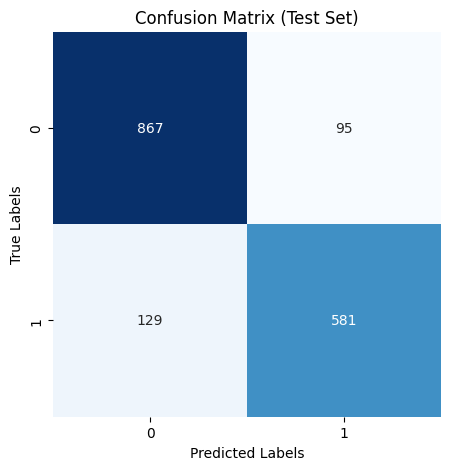

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix
# Generate and plot the Confusion Matrix for the test set
conf_matrix = confusion_matrix(y_test, y_test_pred_rf)

plt.figure(figsize=(5, 5))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix (Test Set)')
plt.show()

In [ ]:
print("Classification Report for Training Data:\n", class_report_train_rf)

Classification Report for Training Data:
               precision    recall  f1-score   support

           0       0.89      0.93      0.91      3884
           1       0.89      0.84      0.87      2800

    accuracy                           0.89      6684
   macro avg       0.89      0.89      0.89      6684
weighted avg       0.89      0.89      0.89      6684



In [ ]:
print("Classification Report for Test Data:\n", class_report_test_rf)

Classification Report for Test Data:
               precision    recall  f1-score   support

           0       0.87      0.90      0.89       962
           1       0.86      0.82      0.84       710

    accuracy                           0.87      1672
   macro avg       0.86      0.86      0.86      1672
weighted avg       0.87      0.87      0.87      1672





---



#    <h1><center>*** </center></h1>



---



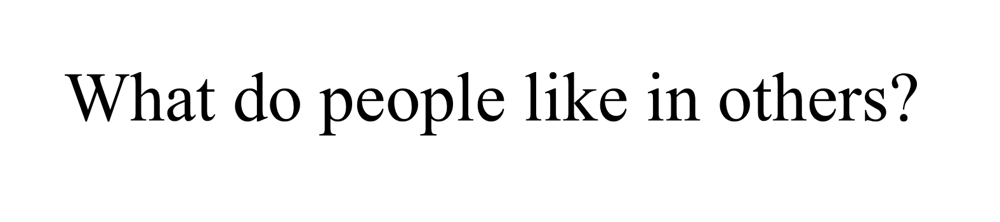

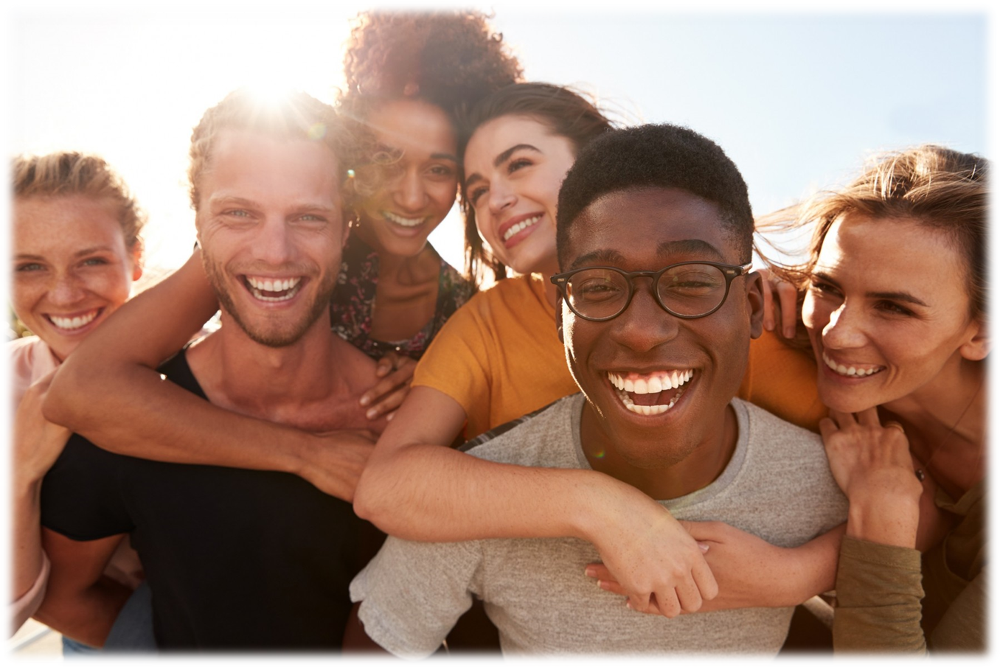

# **Data Reading**

In [ ]:
option1_1 = df_model.copy()
option1_1.head(5)

,int_corr,age_o,pf_o_att,pf_o_sin,pf_o_fun,pf_o_amb,pf_o_sha,attr_o,sinc_o,intel_o,...,met_o,field_cd,undergra,race,from,date,go_out,career_c,met,dec
0,0.14,27,35.0,20.0,20.0,0.0,5.0,6.0,8.0,8.0,...,0,1,-1,4,48,7,1,1,0,1
1,0.54,22,60.0,0.0,40.0,0.0,0.0,7.0,8.0,10.0,...,0,1,-1,4,48,7,1,1,1,1
2,0.16,22,19.0,18.0,18.0,14.0,12.0,10.0,10.0,10.0,...,1,1,-1,4,48,7,1,1,1,1
3,0.61,23,30.0,5.0,40.0,5.0,5.0,7.0,8.0,9.0,...,0,1,-1,4,48,7,1,1,0,1
4,0.21,24,30.0,10.0,10.0,10.0,20.0,8.0,7.0,9.0,...,0,1,-1,4,48,7,1,1,0,1


In [ ]:
# The shape of a DataFrame
option1_1.shape

(8356, 84)

In [ ]:
column_names_with_suffix_o = [col for col in option1_1.columns if col.endswith("_o")]

# Add the column name "dec" to the list
column_names_with_suffix_o.extend(["dec", "gender", "wave"])

# Now, 'column_names_with_suffix_o' contains the column names with the "_o" suffix as well as "dec", "gender", "wave"
print(column_names_with_suffix_o)

['age_o', 'attr_o', 'sinc_o', 'intel_o', 'fun_o', 'amb_o', 'shar_o', 'like_o', 'prob_o', 'race_o', 'dec_o', 'met_o', 'dec', 'gender', 'wave']


In [ ]:
option1_1 = option1_1[column_names_with_suffix_o]
option1_1.shape

(8356, 15)

**corr plot**

<ipython-input-68-d88add45d032>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cor_to_target.sort_values(by='dec', inplace=True)


<Axes: >

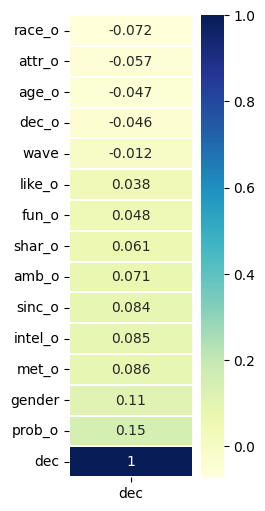

In [ ]:
correlation_mat = option1_1.corr()
cor_to_target = correlation_mat[['dec']]
cor_to_target.sort_values(by='dec', inplace=True)
plt.figure(figsize=(2,6))
sns.heatmap(cor_to_target, annot=True,linewidths=.2,cmap="YlGnBu")

# **Pre-processing**

In [ ]:
# Create a list of numeric columns that also appear in 'column_names_with_suffix_o'
option1_1_numeric_cols = [col for col in column_names_with_suffix_o if col in numeric_cols]

# Create a list of categorical columns that also appear in 'column_names_with_suffix_o'
option1_1_categorical_cols = [col for col in column_names_with_suffix_o if col in categorical_cols]

# Now, 'option1_1_numeric_cols' contains the common numeric columns, and 'option1_1_categorical_cols' contains the common categorical columns
print("option1_1_numeric_cols:", option1_1_numeric_cols)
print("option1_1_categorical_cols:", option1_1_categorical_cols)

option1_1_numeric_cols: ['age_o', 'attr_o', 'sinc_o', 'intel_o', 'fun_o', 'amb_o', 'shar_o', 'like_o', 'prob_o']
option1_1_categorical_cols: ['race_o', 'dec_o', 'met_o', 'gender', 'wave']


## **Train-Test Split**<br/>
First, we create a variable x to store the independent attributes of the dataset. <br/>Additionally, we create a variable y to store only the target variable (dec).

In [ ]:
# Remove "dec" from all_columns to create column_names_without_dec
column_names_without_dec = [col for col in column_names_with_suffix_o if col != "dec"]

# Assuming you have a DataFrame named option1_1
# Separate the target column "dec" from the rest of the features
x = option1_1[column_names_without_dec]
y = option1_1["dec"]

# Print the shapes of x and y
print(f'x shape: {x.shape}, y shape: {y.shape}')

x shape: (8356, 14), y shape: (8356,)


In [ ]:
from sklearn.model_selection import train_test_split

# Assuming x and y are properly defined
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.20, random_state=0, stratify=x[['gender', 'wave']])

print(f'x train: {len(x_train)}, x test: {len(x_test)}')
print(f'y train: {len(y_train)}, y test: {len(y_test)}')

x train: 6684, x test: 1672
y train: 6684, y test: 1672


## **Features Encoding**

In [ ]:
# Numeric Features
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
scaler.fit(x_train[option1_1_numeric_cols])
x_train_numeric = scaler.transform(x_train[option1_1_numeric_cols])
x_test_numeric = scaler.transform(x_test[option1_1_numeric_cols])

print(f'x train: {x_train_numeric.shape}, x test: {x_test_numeric.shape}\n\n')

x train: (6684, 9), x test: (1672, 9)




In [ ]:
# Categorial Features
from sklearn.preprocessing import OneHotEncoder

enc = OneHotEncoder(handle_unknown='ignore')
enc.fit(x_train[option1_1_categorical_cols])
x_train_categorial = enc.transform(x_train[option1_1_categorical_cols])
x_test_categorial = enc.transform(x_test[option1_1_categorical_cols])

print(f'x train: {x_train_categorial.shape}, x test: {x_test_categorial.shape}\n\n')

x train: (6684, 34), x test: (1672, 34)




##### **Combine the features**

In [ ]:
x_train = np.asarray(np.hstack((x_train_numeric, x_train_categorial.todense())))
x_test = np.asarray(np.hstack((x_test_numeric, x_test_categorial.todense())))

print(f'x train shape: {x_train.shape}, x test shape: {x_test.shape}')

x train shape: (6684, 43), x test shape: (1672, 43)


## **Assessing Multiple Algorithms**<br/>
Algorithm selection is a key challenge in any machine learning project since there is not algorithm that is the best across all projects. Generally, we need to evaluate a set of potential candidates and select for further evaluation those that provide better performance.

In this project, we compare 5 different algorithms, all of them already implemented in Scikit-Learn:<br/>

* Random Forest
* K Neighbors Neighbours(KNN)
* Support Vector Machines(SVC)
* Logistic Regression
* Decision Tree

In [ ]:
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier

# Create a list of candidate models
models = [
    ('Random Forest', RandomForestClassifier()),
    ('SVC', SVC()),
    ('Logistic Regression', LogisticRegression(max_iter=1000)),
    ('K-Nearest Neighbors', KNeighborsClassifier()),
    ('Decision Tree Classifier', DecisionTreeClassifier())
]

# Split your data into training and testing sets
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42)  # Adjust test_size as needed

# Add scaling data to your pipeline
scaler = StandardScaler()
x_train_scaled = scaler.fit_transform(x_train)
x_test_scaled = scaler.transform(x_test)

# Initialize variables to track the best model and accuracy
best_model = None
best_accuracy = 0

# Test the accuracy of each model using default hyperparameters
results = []
names = []
scoring = 'accuracy'
for name, model in models:
    # Fit the model with the training data
    model.fit(x_train_scaled, y_train)
    # Make predictions with the testing data
    predictions = model.predict(x_test_scaled)
    # Calculate accuracy
    accuracy = accuracy_score(y_test, predictions)
    # Append the model name and the accuracy to the lists
    results.append(accuracy)
    names.append(name)
    # Print classifier accuracy
    print('Classifier: {}, Accuracy: {:.2f}%'.format(name, accuracy * 100))

    # Check if this model has the best accuracy so far
    if accuracy > best_accuracy:
        best_accuracy = accuracy
        best_model = name

# Print the best model and its accuracy
print("\nBest Model: {}, Accuracy: {:.2f}%".format(best_model, best_accuracy * 100))

Classifier: Random Forest, Accuracy: 62.50%
Classifier: SVC, Accuracy: 62.20%
Classifier: Logistic Regression, Accuracy: 60.71%
Classifier: K-Nearest Neighbors, Accuracy: 61.06%
Classifier: Decision Tree Classifier, Accuracy: 56.16%

Best Model: Random Forest, Accuracy: 62.50%


In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import RandomizedSearchCV

# Define the parameter grid for Random Forest
random_forest_grid = {
    'n_estimators': [80, 90, 100, 110, 115, 120],
    'max_depth': [3, 4, 5, 6],
    'max_features': [None, 'auto', 'sqrt', 'log2'],
    'min_samples_split': [2, 3, 4, 5]}

# Calculate the total number of possible combinations in the grid
total_combinations = len(random_forest_grid['n_estimators']) * len(random_forest_grid['max_depth']) * len(random_forest_grid['max_features']) * len(random_forest_grid['min_samples_split'])

# Set n_iter based on the dataset size and the number of possible combinations
# Adjust this value as needed; you may use a fraction of total_combinations
n_iter = min(150, total_combinations)

# Create a RandomizedSearchCV object for Random Forest
random_forest_random_search = RandomizedSearchCV(
    estimator=RandomForestClassifier(),
    param_distributions=random_forest_grid,
    cv=5,
    n_iter=n_iter,  # Adjusted n_iter value
    n_jobs=-1)

# Fit the Random Forest model with random search
random_forest_random_search.fit(x_train, y_train)

# Print the best hyperparameters after tuning
print("Best Hyperparameters:", random_forest_random_search.best_params_)

# Save the best hyperparameters in the variable best_rf_hyperparameters
best_rf_hyperparameters = random_forest_random_search.best_params_

Best Hyperparameters: {'n_estimators': 100, 'min_samples_split': 2, 'max_features': None, 'max_depth': 6}


In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split, cross_val_score

# Access the best hyperparameters from the dictionary
best_n_estimators = best_rf_hyperparameters['n_estimators']
best_max_depth = best_rf_hyperparameters['max_depth']
best_max_features = best_rf_hyperparameters['max_features']
best_min_samples_split = best_rf_hyperparameters['min_samples_split']

# Create a Random Forest model with the best hyperparameters
best_rf = RandomForestClassifier(
    n_estimators=best_n_estimators,
    max_depth=best_max_depth,
    max_features=best_max_features,
    min_samples_split=best_min_samples_split
)

# Get unique wave numbers from the 'wave' column
unique_waves = FE_df_model['wave'].unique()

# Create an empty dictionary to store the accuracy for each wave number
wave_accuracies = {}  # Define the dictionary

# Loop through each unique wave number and perform cross-validation
for wave_number in unique_waves:
    # Filter the data for the current wave number
    wave_data = FE_df_model[FE_df_model['wave'] == wave_number]

    # Extract features and targets for the current wave number
    x_wave = wave_data.drop('dec', axis=1)
    y_wave = wave_data['dec']

    # Perform cross-validation for the current wave number
    wave_accuracy = np.mean(cross_val_score(best_rf, x_wave, y_wave, cv=5))

    # Store the accuracy for the current wave number
    wave_accuracies[wave_number] = wave_accuracy

# Print the accuracy for each wave number
for wave_number, accuracy in wave_accuracies.items():
    print(f"Wave {wave_number}: Accuracy = {accuracy:.4f}")

# Calculate and print the average accuracy for all wave numbers
average_accuracy = np.mean(list(wave_accuracies.values()))
print(f"Average Accuracy for All Wave Numbers: {average_accuracy:.4f}")

Wave 1: Accuracy = 0.8600
Wave 2: Accuracy = 0.7040
Wave 3: Accuracy = 0.7450
Wave 4: Accuracy = 0.8410
Wave 5: Accuracy = 0.8111
Wave 6: Accuracy = 0.6800
Wave 7: Accuracy = 0.7847
Wave 8: Accuracy = 0.7700
Wave 9: Accuracy = 0.7512
Wave 10: Accuracy = 0.7468
Wave 11: Accuracy = 0.7269
Wave 12: Accuracy = 0.8368
Wave 13: Accuracy = 0.7611
Wave 14: Accuracy = 0.8236
Wave 15: Accuracy = 0.7851
Wave 16: Accuracy = 0.8111
Wave 17: Accuracy = 0.6893
Wave 18: Accuracy = 0.5500
Wave 19: Accuracy = 0.8000
Wave 20: Accuracy = 0.5941
Wave 21: Accuracy = 0.8503
Average Accuracy for All Wave Numbers: 0.7582


In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report

# Train the model on your training data
best_rf.fit(x_train, y_train)

# Make predictions on both the training and test data
y_train_pred_rf = best_rf.predict(x_train)
y_test_pred_rf = best_rf.predict(x_test)

# Generate and print classification reports for both sets
class_report_train_rf = classification_report(y_train, y_train_pred_rf)
class_report_test_rf = classification_report(y_test, y_test_pred_rf)

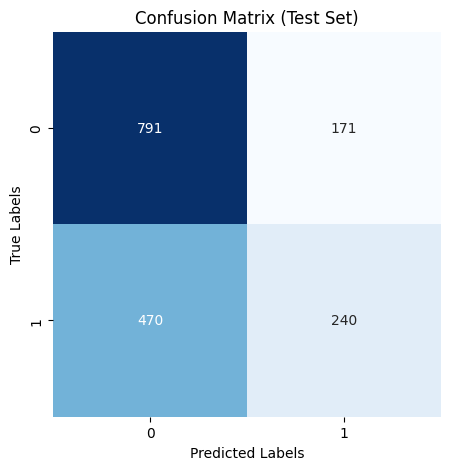

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix
# Generate and plot the Confusion Matrix for the test set
conf_matrix = confusion_matrix(y_test, y_test_pred_rf)

plt.figure(figsize=(5, 5))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix (Test Set)')
plt.show()

In [ ]:
print("Classification Report for Training Data:\n", class_report_train_rf)

Classification Report for Training Data:
               precision    recall  f1-score   support

           0       0.68      0.87      0.76      3884
           1       0.70      0.42      0.53      2800

    accuracy                           0.68      6684
   macro avg       0.69      0.65      0.64      6684
weighted avg       0.69      0.68      0.66      6684



In [ ]:
print("Classification Report for Test Data:\n", class_report_test_rf)

Classification Report for Test Data:
               precision    recall  f1-score   support

           0       0.63      0.82      0.71       962
           1       0.58      0.34      0.43       710

    accuracy                           0.62      1672
   macro avg       0.61      0.58      0.57      1672
weighted avg       0.61      0.62      0.59      1672



**The accuracy of the classification**

In [ ]:
# Evaluate the model with the best hyperparameters on the test set
best_rf = random_forest_random_search.best_estimator_
test_accuracy = best_rf.score(x_test, y_test)
print("Test Accuracy with Best Hyperparameters:", test_accuracy)

Test Accuracy with Best Hyperparameters: 0.6118421052631579


As you may have noticed, the previous summary does not contain the accuracy of the classification. <br/>However, this can be easily calculated using the function accuracy_score from the metrics module.



---



#    <h1><center>*** </center></h1>



---



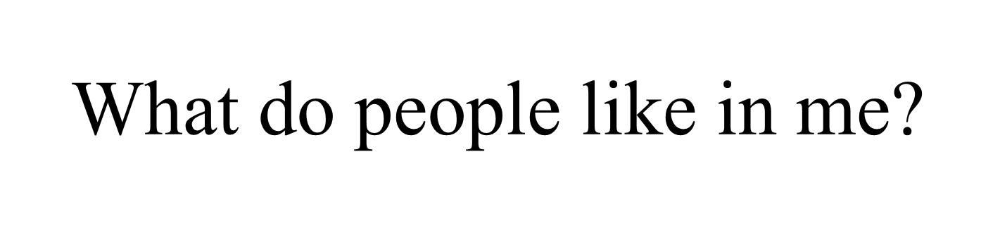

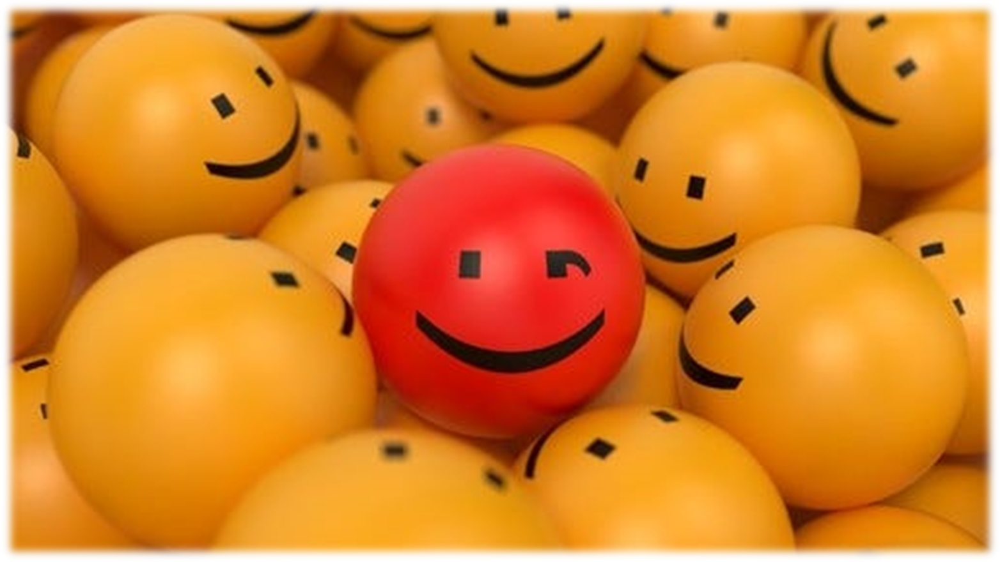

# **Data Reading**

In [ ]:
option1_2 = df_model.copy()
option1_2.head(5)

,int_corr,age_o,pf_o_att,pf_o_sin,pf_o_fun,pf_o_amb,pf_o_sha,attr_o,sinc_o,intel_o,...,met_o,field_cd,undergra,race,from,date,go_out,career_c,met,dec
0,0.14,27,35.0,20.0,20.0,0.0,5.0,6.0,8.0,8.0,...,0,1,-1,4,48,7,1,1,0,1
1,0.54,22,60.0,0.0,40.0,0.0,0.0,7.0,8.0,10.0,...,0,1,-1,4,48,7,1,1,1,1
2,0.16,22,19.0,18.0,18.0,14.0,12.0,10.0,10.0,10.0,...,1,1,-1,4,48,7,1,1,1,1
3,0.61,23,30.0,5.0,40.0,5.0,5.0,7.0,8.0,9.0,...,0,1,-1,4,48,7,1,1,0,1
4,0.21,24,30.0,10.0,10.0,10.0,20.0,8.0,7.0,9.0,...,0,1,-1,4,48,7,1,1,0,1


In [ ]:
# The shape of a DataFrame
option1_2.shape

(8356, 84)

In [ ]:
column_names_with_suffix = ['age', 'attr', 'sinc', 'intel', 'fun', 'amb', 'shar', 'like', 'prob', 'race', 'dec', 'met', 'dec_o', 'gender', 'wave']
print(column_names_with_suffix)

['age', 'attr', 'sinc', 'intel', 'fun', 'amb', 'shar', 'like', 'prob', 'race', 'dec', 'met', 'dec_o', 'gender', 'wave']


In [ ]:
option1_2 = option1_2[column_names_with_suffix]
option1_2.shape

(8356, 15)

**corr plot**

<ipython-input-87-96074a3d5f1c>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cor_to_target.sort_values(by='dec_o', inplace=True)


<Axes: >

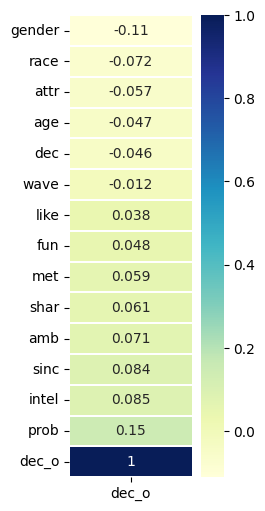

In [ ]:
correlation_mat = option1_2.corr()
cor_to_target = correlation_mat[['dec_o']]
cor_to_target.sort_values(by='dec_o', inplace=True)
plt.figure(figsize=(2,6))
sns.heatmap(cor_to_target, annot=True,linewidths=.2,cmap="YlGnBu")

# **Pre-processing**

In [ ]:
# Create a list of numeric columns that also appear in 'column_names_with_suffix'
option1_2_numeric_cols = [col for col in column_names_with_suffix if col in numeric_cols]

# Create a list of categorical columns that also appear in 'column_names_with_suffix'
option1_2_categorical_cols = [col for col in column_names_with_suffix if col in categorical_cols]

# Replace 'dec_o' with 'dec' in the list of categorical columns
option1_2_categorical_cols = [col if col != 'dec_o' else 'dec' for col in option1_2_categorical_cols]

# Now, 'option1_2_numeric_cols' contains the common numeric columns, and 'option1_2_categorical_cols' contains the common categorical columns
print("option1_2_categorical_cols:", option1_2_categorical_cols)
print("option1_2_numeric_cols:", option1_2_numeric_cols)

option1_2_categorical_cols: ['race', 'met', 'dec', 'gender', 'wave']
option1_2_numeric_cols: ['age', 'attr', 'sinc', 'intel', 'fun', 'amb', 'shar', 'like', 'prob']


## **Train-Test Split**<br/>
First, we create a variable x to store the independent attributes of the dataset. <br/>Additionally, we create a variable y to store only the target variable (dec).

In [ ]:
# Remove "dec" from all_columns to create column_names_without_dec
column_names_without_dec_o = [col for col in column_names_with_suffix if col != "dec_o"]

# Assuming you have a DataFrame named option1_2
# Separate the target column "dec" from the rest of the features
x = option1_2[column_names_without_dec_o]
y = option1_2["dec_o"]

# Print the shapes of x and y
print(f'x shape: {x.shape}, y shape: {y.shape}')

x shape: (8356, 14), y shape: (8356,)


In [ ]:
from sklearn.model_selection import train_test_split

# Assuming x and y are properly defined
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.20, random_state=0, stratify=x[['gender', 'wave']])

print(f'x train: {len(x_train)}, x test: {len(x_test)}')
print(f'y train: {len(y_train)}, y test: {len(y_test)}')

x train: 6684, x test: 1672
y train: 6684, y test: 1672


## **Features Encoding**

In [ ]:
# Numeric Features
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
scaler.fit(x_train[option1_2_numeric_cols])
x_train_numeric = scaler.transform(x_train[option1_2_numeric_cols])
x_test_numeric = scaler.transform(x_test[option1_2_numeric_cols])

print(f'x train: {x_train_numeric.shape}, x test: {x_test_numeric.shape}\n\n')

x train: (6684, 9), x test: (1672, 9)




In [ ]:
# Categorial Features
from sklearn.preprocessing import OneHotEncoder

enc = OneHotEncoder(handle_unknown='ignore')
enc.fit(x_train[option1_2_categorical_cols])
x_train_categorial = enc.transform(x_train[option1_2_categorical_cols])
x_test_categorial = enc.transform(x_test[option1_2_categorical_cols])

print(f'x train: {x_train_categorial.shape}, x test: {x_test_categorial.shape}\n\n')

x train: (6684, 34), x test: (1672, 34)




In [ ]:
x_train = np.asarray(np.hstack((x_train_numeric, x_train_categorial.todense())))
x_test = np.asarray(np.hstack((x_test_numeric, x_test_categorial.todense())))

print(f'x train shape: {x_train.shape}, x test shape: {x_test.shape}')

x train shape: (6684, 43), x test shape: (1672, 43)


## **Assessing Multiple Algorithms**<br/>
Algorithm selection is a key challenge in any machine learning project since there is not algorithm that is the best across all projects. Generally, we need to evaluate a set of potential candidates and select for further evaluation those that provide better performance.

In this project, we compare 5 different algorithms, all of them already implemented in Scikit-Learn:<br/>

* Random Forest
* K Neighbors Neighbours(KNN)
* Support Vector Machines(SVC)
* Logistic Regression
* Decision Tree

In [ ]:
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier

# Create a list of candidate models
models = [
    ('Random Forest', RandomForestClassifier()),
    ('SVC', SVC()),
    ('Logistic Regression', LogisticRegression(max_iter=1000)),
    ('K-Nearest Neighbors', KNeighborsClassifier()),
    ('Decision Tree Classifier', DecisionTreeClassifier())
]

# Split your data into training and testing sets
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42)  # Adjust test_size as needed

# Add scaling data to your pipeline
scaler = StandardScaler()
x_train_scaled = scaler.fit_transform(x_train)
x_test_scaled = scaler.transform(x_test)

# Initialize variables to track the best model and accuracy
best_model = None
best_accuracy = 0

# Test the accuracy of each model using default hyperparameters
results = []
names = []
scoring = 'accuracy'
for name, model in models:
    # Fit the model with the training data
    model.fit(x_train_scaled, y_train)
    # Make predictions with the testing data
    predictions = model.predict(x_test_scaled)
    # Calculate accuracy
    accuracy = accuracy_score(y_test, predictions)
    # Append the model name and the accuracy to the lists
    results.append(accuracy)
    names.append(name)
    # Print classifier accuracy
    print('Classifier: {}, Accuracy: {:.2f}%'.format(name, accuracy * 100))

    # Check if this model has the best accuracy so far
    if accuracy > best_accuracy:
        best_accuracy = accuracy
        best_model = name

# Print the best model and its accuracy
print("\nBest Model: {}, Accuracy: {:.2f}%".format(best_model, best_accuracy * 100))

Classifier: Random Forest, Accuracy: 62.50%
Classifier: SVC, Accuracy: 64.53%
Classifier: Logistic Regression, Accuracy: 63.88%
Classifier: K-Nearest Neighbors, Accuracy: 61.30%
Classifier: Decision Tree Classifier, Accuracy: 58.43%

Best Model: SVC, Accuracy: 64.53%


In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import RandomizedSearchCV

random_forest_grid = {
    'n_estimators': [80, 90, 100, 110, 115, 120],
    'max_depth': [3, 4, 5, 6],
    'max_features': [None, 'auto', 'sqrt', 'log2'],
    'min_samples_split': [2, 3, 4, 5]}

total_combinations = len(random_forest_grid['n_estimators']) * len(random_forest_grid['max_depth']) * len(random_forest_grid['max_features']) * len(random_forest_grid['min_samples_split'])
n_iter = min(150, total_combinations)
random_forest_random_search = RandomizedSearchCV(estimator=RandomForestClassifier(),param_distributions=random_forest_grid,  cv=5, n_iter=n_iter,  n_jobs=-1)
random_forest_random_search.fit(x_train, y_train)
print("Best Hyperparameters:", random_forest_random_search.best_params_)
best_rf_hyperparameters = random_forest_random_search.best_params_

Best Hyperparameters: {'n_estimators': 115, 'min_samples_split': 2, 'max_features': None, 'max_depth': 6}


In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split, cross_val_score

best_n_estimators = best_rf_hyperparameters['n_estimators']
best_max_depth = best_rf_hyperparameters['max_depth']
best_max_features = best_rf_hyperparameters['max_features']
best_min_samples_split = best_rf_hyperparameters['min_samples_split']

best_rf = RandomForestClassifier(
    n_estimators=best_n_estimators,
    max_depth=best_max_depth,
    max_features=best_max_features,
    min_samples_split=best_min_samples_split
)

unique_waves = FE_df_model['wave'].unique()
wave_accuracies = {}
for wave_number in unique_waves:
    wave_data = FE_df_model[FE_df_model['wave'] == wave_number]
    x_wave = wave_data.drop('dec', axis=1)
    y_wave = wave_data['dec']
    wave_accuracy = np.mean(cross_val_score(best_rf, x_wave, y_wave, cv=5))
    wave_accuracies[wave_number] = wave_accuracy

for wave_number, accuracy in wave_accuracies.items():
    print(f"Wave {wave_number}: Accuracy = {accuracy:.4f}")

average_accuracy = np.mean(list(wave_accuracies.values()))
print(f"Average Accuracy for All Wave Numbers: {average_accuracy:.4f}")

Wave 1: Accuracy = 0.8400
Wave 2: Accuracy = 0.7089
Wave 3: Accuracy = 0.7900
Wave 4: Accuracy = 0.8364
Wave 5: Accuracy = 0.8222
Wave 6: Accuracy = 0.7000
Wave 7: Accuracy = 0.7867
Wave 8: Accuracy = 0.7850
Wave 9: Accuracy = 0.7675
Wave 10: Accuracy = 0.7530
Wave 11: Accuracy = 0.7292
Wave 12: Accuracy = 0.8291
Wave 13: Accuracy = 0.7278
Wave 14: Accuracy = 0.8236
Wave 15: Accuracy = 0.8011
Wave 16: Accuracy = 0.8326
Wave 17: Accuracy = 0.6893
Wave 18: Accuracy = 0.5500
Wave 19: Accuracy = 0.8111
Wave 20: Accuracy = 0.5713
Wave 21: Accuracy = 0.8534
Average Accuracy for All Wave Numbers: 0.7623


In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report

# Train the model on your training data
best_rf.fit(x_train, y_train)

# Make predictions on both the training and test data
y_train_pred_rf = best_rf.predict(x_train)
y_test_pred_rf = best_rf.predict(x_test)

# Generate and print classification reports for both sets
class_report_train_rf = classification_report(y_train, y_train_pred_rf)
class_report_test_rf = classification_report(y_test, y_test_pred_rf)

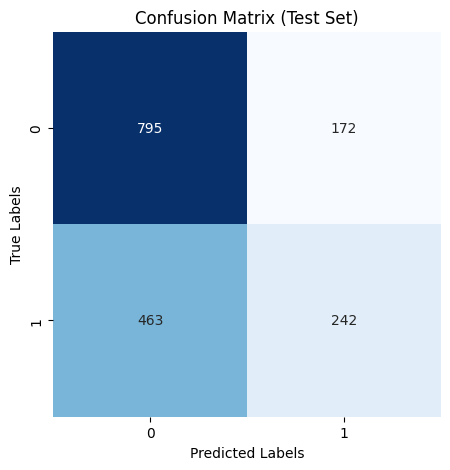

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix

conf_matrix = confusion_matrix(y_test, y_test_pred_rf)

plt.figure(figsize=(5, 5))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix (Test Set)')
plt.show()

In [ ]:
print("Classification Report for Training Data:\n", class_report_train_rf)

Classification Report for Training Data:
               precision    recall  f1-score   support

           0       0.68      0.86      0.76      3879
           1       0.69      0.44      0.53      2805

    accuracy                           0.68      6684
   macro avg       0.68      0.65      0.65      6684
weighted avg       0.68      0.68      0.66      6684



In [ ]:
print("Classification Report for Test Data:\n", class_report_test_rf)

Classification Report for Test Data:
               precision    recall  f1-score   support

           0       0.63      0.82      0.71       967
           1       0.58      0.34      0.43       705

    accuracy                           0.62      1672
   macro avg       0.61      0.58      0.57      1672
weighted avg       0.61      0.62      0.60      1672



**The accuracy of the classification**

In [ ]:
# Evaluate the model with the best hyperparameters on the test set
best_rf = random_forest_random_search.best_estimator_
test_accuracy = best_rf.score(x_test, y_test)
print("Test Accuracy with Best Hyperparameters:", test_accuracy)

Test Accuracy with Best Hyperparameters: 0.6214114832535885
